Take a copy of this notebook for each model you will implement.

This is the initial notebook — any changes will be made here before starting model building to ensure consistency across all notebooks.

**Key Consistency Tips**

* Standardized Headings: Use identical section names across all notebooks.

* Code Comments: Explain non-trivial steps (e.g., "Handling class imbalance with SMOTE").

* Version Control: Add a requirements.txt in the repo for dependency management. مش لازم

* Outputs: Save all plots/figures to a /results folder with consistent naming (e.g., XGBoost_SHAP.png).
اعتقد هتبقى كويسة عشان واحنا بنعمل البيبر ما نقعدش ناخد سكرينات


* Reproducibility: Set global random seeds (e.g., np.random.seed(42)).

# **Imports**

In [ ]:
%%capture
!pip install -q lime shap

In [ ]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
import kagglehub
from sklearn.model_selection import train_test_split, learning_curve, ValidationCurveDisplay
from sklearn.metrics import accuracy_score, classification_report, ConfusionMatrixDisplay, RocCurveDisplay, auc
from sklearn.metrics import PrecisionRecallDisplay
import shap
from shap import Explanation, plots
from sklearn.inspection import PartialDependenceDisplay
import warnings
warnings.filterwarnings('ignore')

# **Utils**

In [ ]:
def our_confusion_matrix(model, name='Model'):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
    ConfusionMatrixDisplay.from_estimator(model, X_train, y_train, cmap="Oranges", ax=ax1)
    ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, cmap="Oranges", ax=ax2)
    plt.title(f"{name} Confusion Matrix")

def our_roc(model, name="Model"):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    roc1 = RocCurveDisplay.from_estimator(
    model, X_train, y_train,
    name=name, ax=ax1,
    color="orange"
    )
    roc2 = RocCurveDisplay.from_estimator(
        model, X_test, y_test,
        name=name, ax=ax2,
        color="orange"
    )
    ax1.fill_between(roc1.fpr, roc1.tpr, alpha=0.4, color="orange")
    ax2.fill_between(roc2.fpr, roc2.tpr, alpha=0.4, color="orange")
    ax1.set_title(f"{name} Training ROC Curve", fontsize=16)
    ax2.set_title(f"{name} Testing ROC Curve", fontsize=16)
    for ax in [ax1, ax2]:
        ax.grid(alpha=0.5)

def our_learning_curve(model, name='Model'):
    train_sizes, train_scores, test_scores = learning_curve(
        model, X_train, y_train, cv=5, scoring='accuracy',
        train_sizes=np.linspace(0.1, 1.0, 10), random_state=0
    )

    plt.figure(figsize=(13, 8))
    plt.plot(train_sizes, np.mean(train_scores, axis=1), 'o-', color="mediumseagreen", label="Training score")
    plt.plot(train_sizes, np.mean(test_scores, axis=1), 'o-', color="royalblue", label="Cross-validation score")
    plt.title(f"{name} Learning Curve")
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    plt.legend(loc="best")
    plt.grid(alpha=0.5)

def our_prc(model, name="Model"):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(21, 13))
    train_disp = PrecisionRecallDisplay.from_estimator(model, X_train, y_train, ax=ax1, color='orange')
    test_disp = PrecisionRecallDisplay.from_estimator(model, X_test, y_test, ax=ax2, color='orange')
    ax1.set_title(f"{name} Precision-Recall Curve - Train")
    ax2.set_title(f"{name} Precision-Recall Curve - Test")
    ax1.fill_between(train_disp.recall, train_disp.precision, alpha=0.4, color='orange')
    ax2.fill_between(test_disp.recall, test_disp.precision, alpha=0.4, color='orange')

# **Load Processed Dat**a

In [ ]:
path = kagglehub.dataset_download('mohamedhassan77/xai-project-processed-data')
df = pd.read_csv(f"{path}/processed_IBM_dataset.csv")
df

100%|██████████| 145k/145k [00:00<00:00, 68.9MB/s]

Extracting files...


,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,...,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,promotion_velocity,workload_score,compensation_ratio,Attrition
0,41,2,1102,2,1,2,1,2,0,94,...,0,1,6,4,0,5,600000.000000,7,0.961804,1
1,49,1,279,1,8,1,1,3,1,61,...,3,3,10,7,1,7,9.999900,1,1.776623,0
2,37,2,1373,1,2,2,4,4,1,92,...,3,3,0,0,0,0,0.000000,5,0.724186,1
3,33,1,1392,1,3,4,1,4,0,56,...,3,3,8,7,3,0,2.666658,5,1.007446,0
4,27,2,591,1,2,1,3,1,1,40,...,3,3,2,2,2,2,0.999995,1,1.201663,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,1,884,1,23,2,3,3,1,41,...,3,3,5,2,0,3,500000.000000,1,0.890852,0
1466,39,2,613,1,6,1,3,4,1,42,...,5,3,7,7,1,7,6.999930,1,1.466892,0
1467,27,2,155,1,4,3,1,2,1,87,...,0,3,6,2,0,3,600000.000000,5,0.952691,0
1468,49,1,1023,2,2,3,3,4,1,63,...,3,2,9,6,0,8,900000.000000,2,0.865030,0


In [ ]:
X = df.drop('Attrition', axis=1)
y = df.Attrition

X_train, X_test, y_train, y_test = train_test_split(
    X, y, random_state=42, stratify=y)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1102, 33), (368, 33), (1102,), (368,))

In [ ]:
feature_names  = list(X_train.columns)

# **Preprocessing**

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = pd.DataFrame(
    scaler.fit_transform(X_train),
    columns=feature_names,
    index=X_train.index
)
X_test = pd.DataFrame(
    scaler.transform(X_test),
    columns=feature_names,
    index=X_test.index
)

# **Model Initialization**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
KNeighborsClassifier().fit(X_train, y_train).score(X_test, y_test)

0.845108695652174

# **Model Training**

In [ ]:
train_acc, test_acc = [], []
for k in range(1, 51):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    train_acc.append(knn.score(X_train, y_train))
    test_acc.append(knn.score(X_test, y_test))


In [ ]:
for i in range(5):
    print(f"K: {i+1}")
    print(f"Train: {train_acc[i]}")
    print(f"Test: {test_acc[i]}")
    print('-'*50)

K: 1
Train: 1.0
Test: 0.8097826086956522
--------------------------------------------------
K: 2
Train: 0.8865698729582577
Test: 0.8532608695652174
--------------------------------------------------
K: 3
Train: 0.9001814882032668
Test: 0.8478260869565217
--------------------------------------------------
K: 4
Train: 0.8711433756805808
Test: 0.845108695652174
--------------------------------------------------
K: 5
Train: 0.8784029038112523
Test: 0.845108695652174
--------------------------------------------------


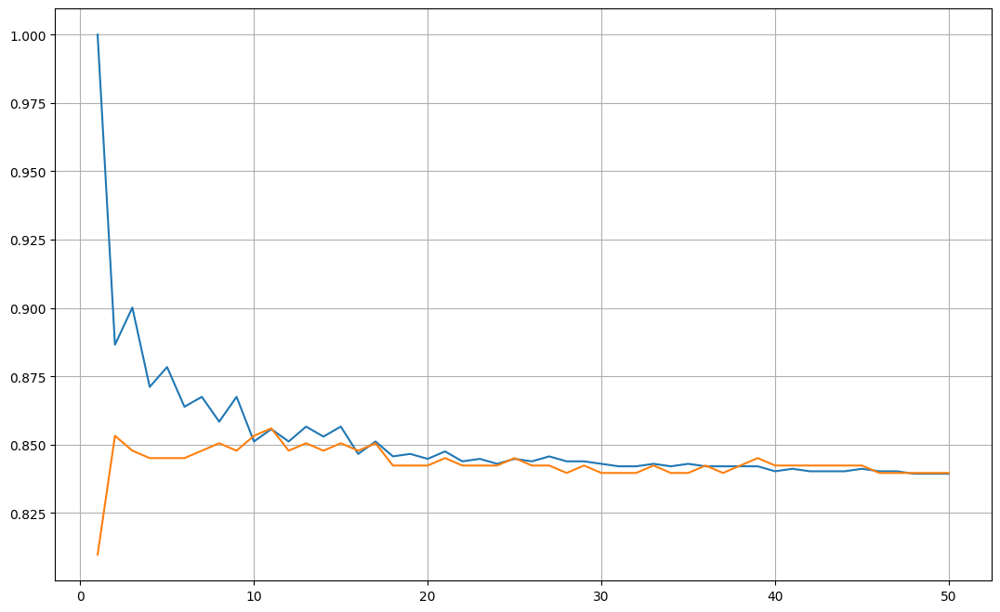

In [ ]:
plt.figure(figsize=(13, 8))
plt.plot(range(1, 51), train_acc)
plt.plot(range(1, 51), test_acc)
plt.grid()

# The best k for knn is 11. it is the highest and

In [ ]:
knn = KNeighborsClassifier(n_neighbors=11)
knn.fit(X_train, y_train).score(X_test, y_test)

0.8559782608695652

# **Model Evaluation**

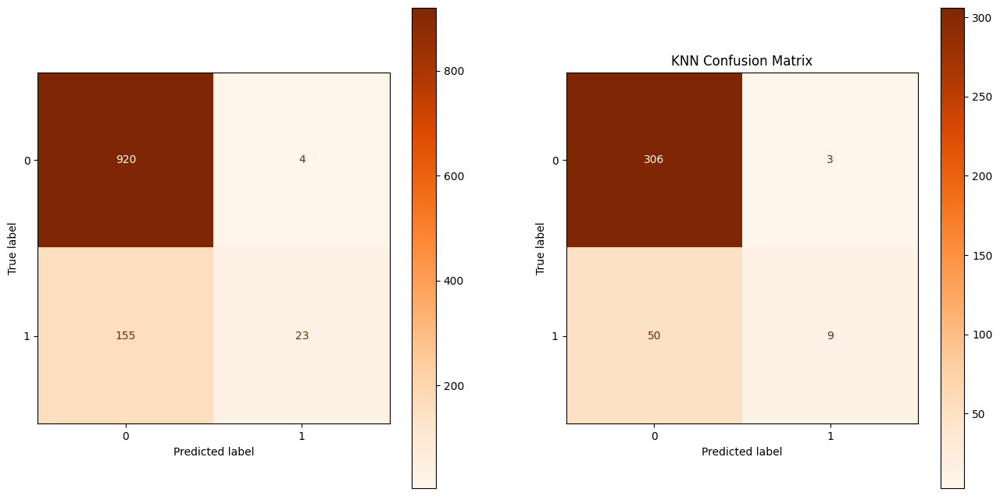

In [ ]:
our_confusion_matrix(knn, "KNN")

The model struggle with identifying the 1 class.

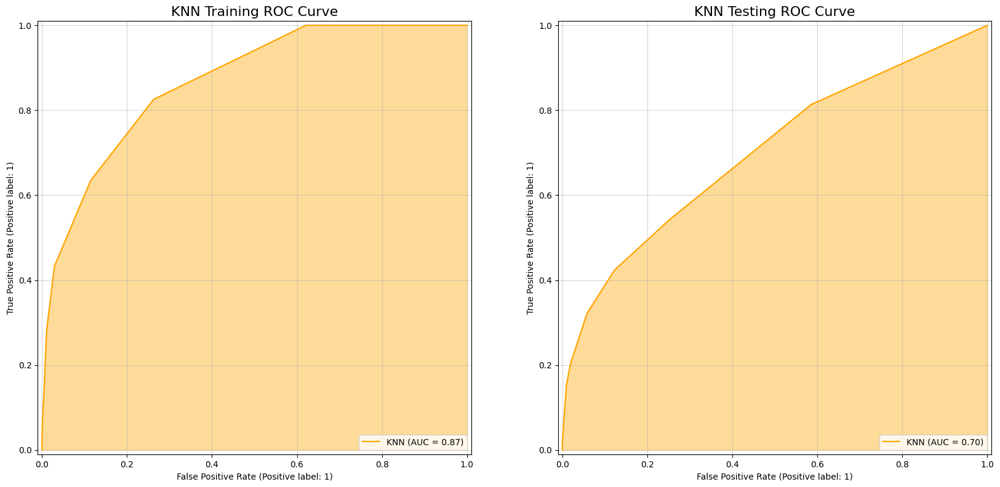

In [ ]:
our_roc(knn, "KNN")

Training AUC = 0.87 which indicates good performance on training data. Testing AUC = 0.7. This indicates overfitting as performance drops from training to testing.

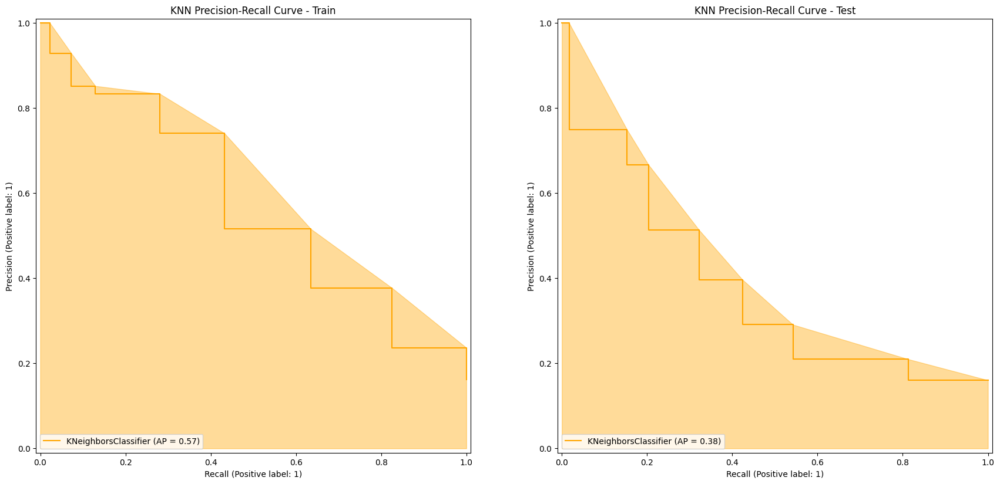

In [ ]:
our_prc(knn, "KNN")

# **Explainability Techniques**

## Feature Importance (Model-Specific)

Text(0.5, 1.0, 'KNN Feature Importances (Permutation)')

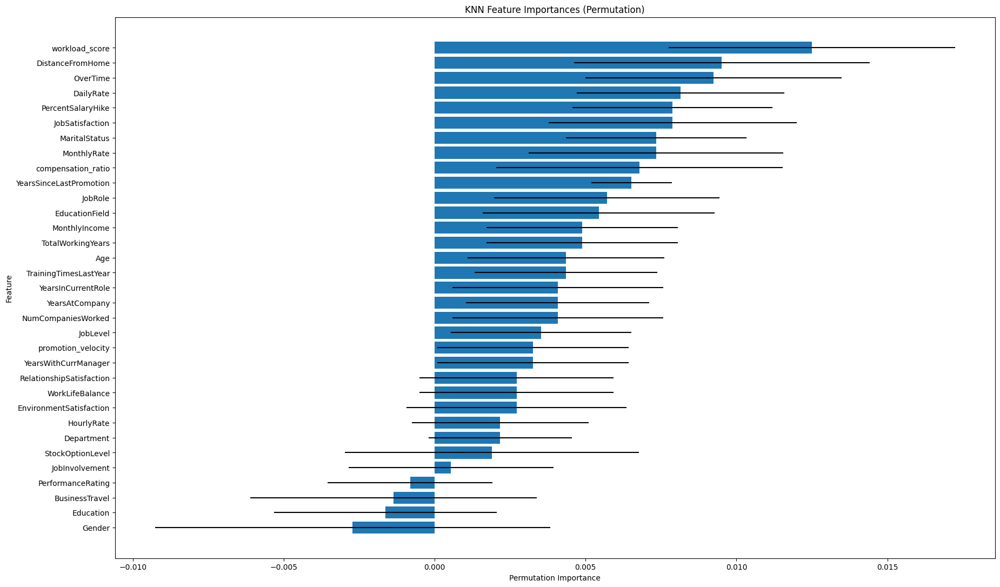

In [ ]:
from sklearn.inspection import permutation_importance
r = permutation_importance(knn, X_test, y_test, n_repeats=10, random_state=42)
importances = r.importances_mean
stds = r.importances_std
indices = np.argsort(importances)
plt.figure(figsize=(21, 13))
plt.barh(range(len(indices)), importances[indices], xerr=stds[indices], align='center')
plt.xlabel("Permutation Importance")
plt.ylabel("Feature")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.title("KNN Feature Importances (Permutation)")

## Partial Dependence Plots

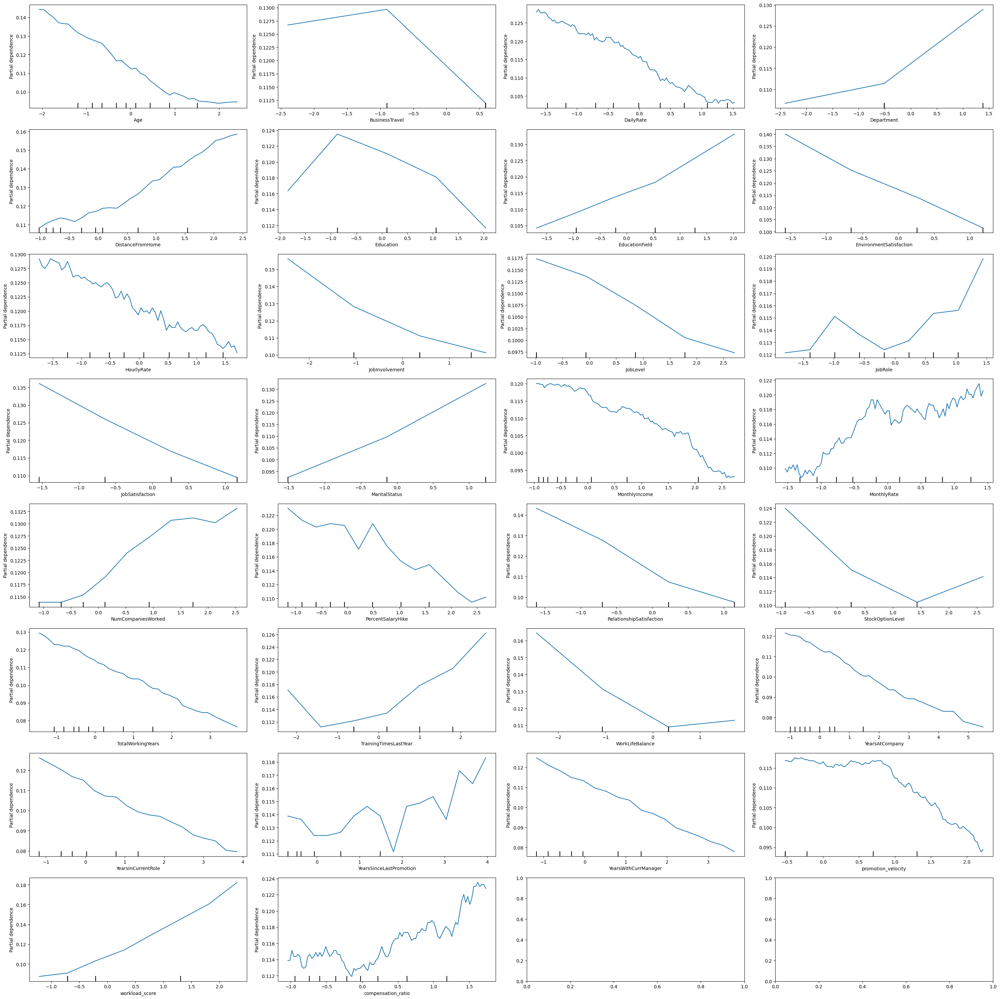

In [ ]:
cols = [c for c in X_test.columns if X_test[c].nunique()>2]
nc = 4
nr = (len(cols) + nc - 1) // nc
fig, axes = plt.subplots(nr, nc, figsize=(30, 30))
for ax, feat in zip(axes.flatten(), cols):
    PartialDependenceDisplay.from_estimator(
        knn, X_test, [feat], ax=ax)
plt.tight_layout()

We note that
* Age: shows negative correlation, which means the older the person, the lower prediction.
* BusinessTravel : Peaks at moderate levels, then decreases.
* JobInvolvement: Strong negative impact. The more you involve the employee, the lower the probability of attrition
* MonthlyIncome : It declines overall, which means the higher the income, the lower the probability of attrition


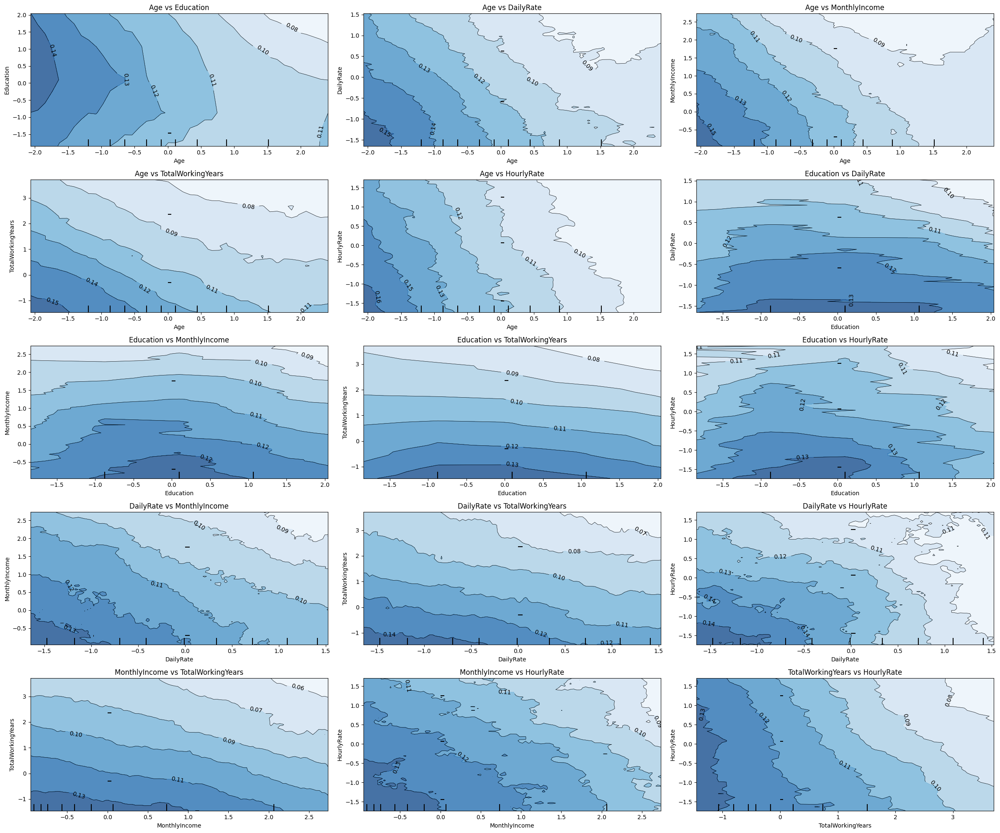

In [ ]:
important_features = ['Age', 'Education', "DailyRate", "MonthlyIncome", "TotalWorkingYears", "HourlyRate"]
feature_pairs = []
for i in range(len(important_features)):
    for j in range(i+1, len(important_features)):
        feature_pairs.append((important_features[i], important_features[j]))

n_pairs = len(feature_pairs)
n_cols = 3
n_rows = (n_pairs + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(24, 4*n_rows))

for ax, feat_pair in zip(axes.flatten(), feature_pairs):
    PartialDependenceDisplay.from_estimator(
        knn, X_test, [feat_pair], ax=ax,
        kind='average', contour_kw={'cmap': 'Blues'})
    ax.set_title(f'{feat_pair[0]} vs {feat_pair[1]}')

plt.tight_layout()

We note that:
* Older individuals tend to have more working years but lower hourly rates.
* Higher education correlates with higher income but fewer total working years.
* There is a weak or negative correlation between monthly income and total working years, which means longer working hours does not necessarily lead to higher income.
* The relationship between age and education is weak, which means older individuals doesn't necessarily have higher education
* There is a strong negative correlation between total working years and hourly rate, which means the longer your experience is, the higher your pay is.

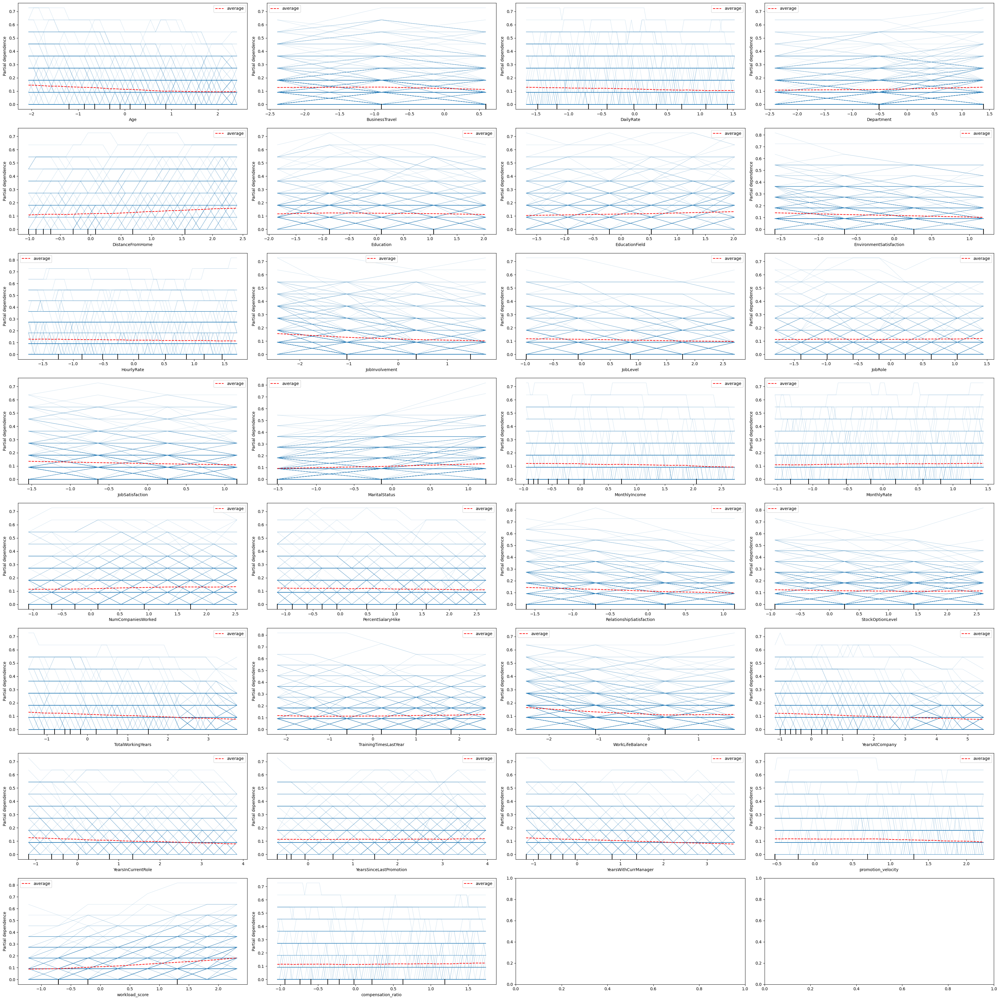

In [ ]:
cols = [c for c in X_test.columns if X_test[c].nunique()>2]
nc = 4
nr = (len(cols) + nc - 1) // nc
fig, axes = plt.subplots(nr, nc, figsize=(34, 34))
for ax, feat in zip(axes.flatten(), cols):
    PartialDependenceDisplay.from_estimator(
        knn, X_test, [feat], ax=ax,
        kind='both', pd_line_kw={'color':'red'}
        )
plt.tight_layout()

Most of the features shows negligible effect on model predictions.

## LIME Analysis

In [ ]:
from lime.lime_tabular import LimeTabularExplainer
explainer = LimeTabularExplainer(X_train.values,
                                 feature_names = list(X_train.columns),
                                 class_names = ['No Attrition', 'Attrition'])
explainer.explain_instance(X_test.values[2],
                           knn.predict_proba).show_in_notebook()

 Low overtime, good work-life balance, and a good salary helps reduce attrition for this employee.

## SHAP Analysis

In [ ]:
explainer = shap.KernelExplainer(knn.predict_proba, X_test[:100])
shap_values = explainer.shap_values(X_test[:100])

  0%|          | 0/100 [00:00<?, ?it/s]

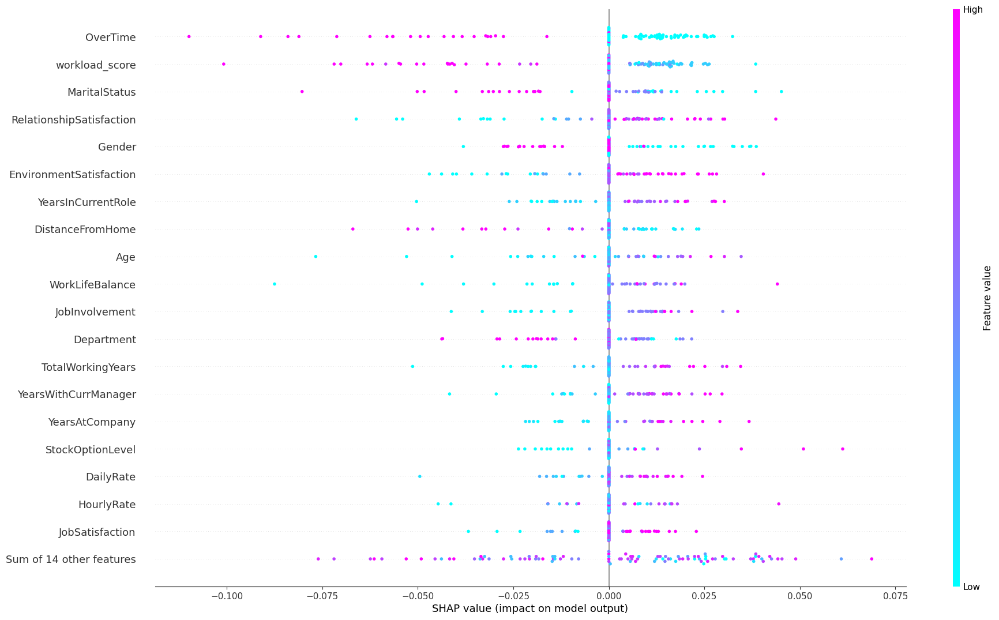

In [ ]:
plots.beeswarm(
    Explanation(
        values=shap_values[:, :, 0],
        base_values=explainer.expected_value[1],
        data=X_test[:100],
        feature_names=getattr(X_test, "columns", None)
    ),
    max_display=20,
    color=plt.get_cmap("cool"),
    plot_size=(21, 13)
)

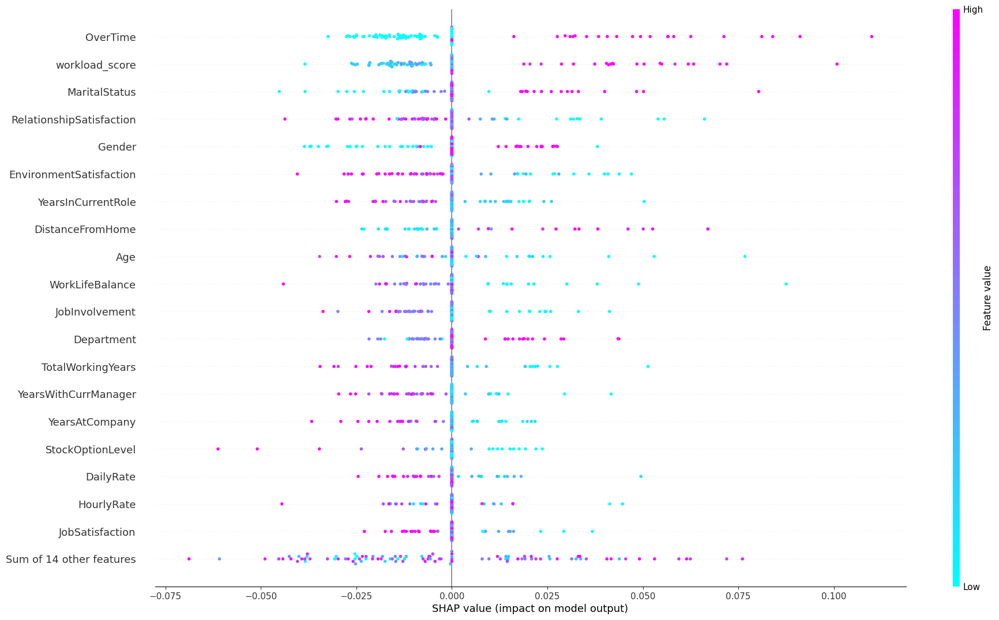

In [ ]:

plots.beeswarm(
    Explanation(
        values=shap_values[:, :, 1],
        base_values=explainer.expected_value[1],
        data=X_test[:100],
        feature_names=getattr(X_test, "columns", None)
    ),
    max_display=20,
    color=plt.get_cmap("cool"),
    plot_size=(21, 13)
)

"MaritalStatus", "workload_score", and "OverTime" have the highest impact on the model's output, with a wide range of SHAP values. "YearsAtCompany" and "MonthlyIncome" show smaller impacts. Positive SHAP values increase predictions, while negative values decrease them.

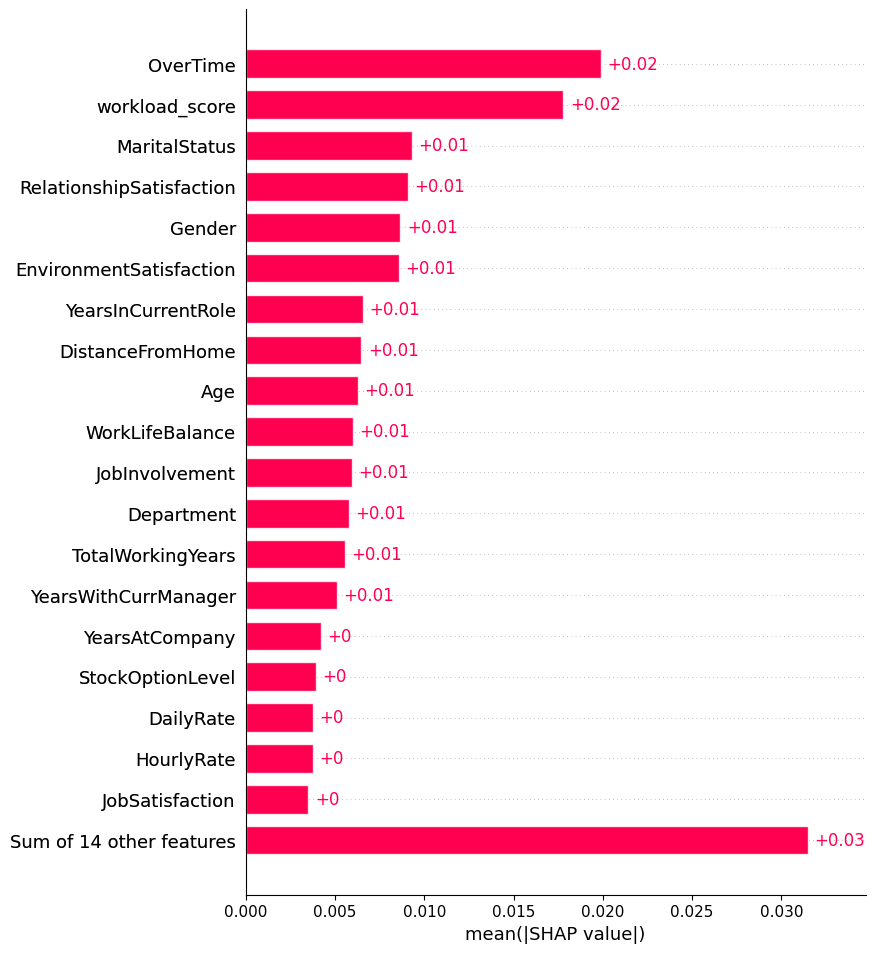

In [ ]:
explanation = Explanation(
    values=shap_values[:, :, 1],
    base_values=explainer.expected_value[1],
    data=X_test.iloc[:100],
    feature_names=X_test.columns
)

shap.plots.bar(explanation, max_display=20)

This graph shows how impactful the features are on our model. features that have high value, have high impact.

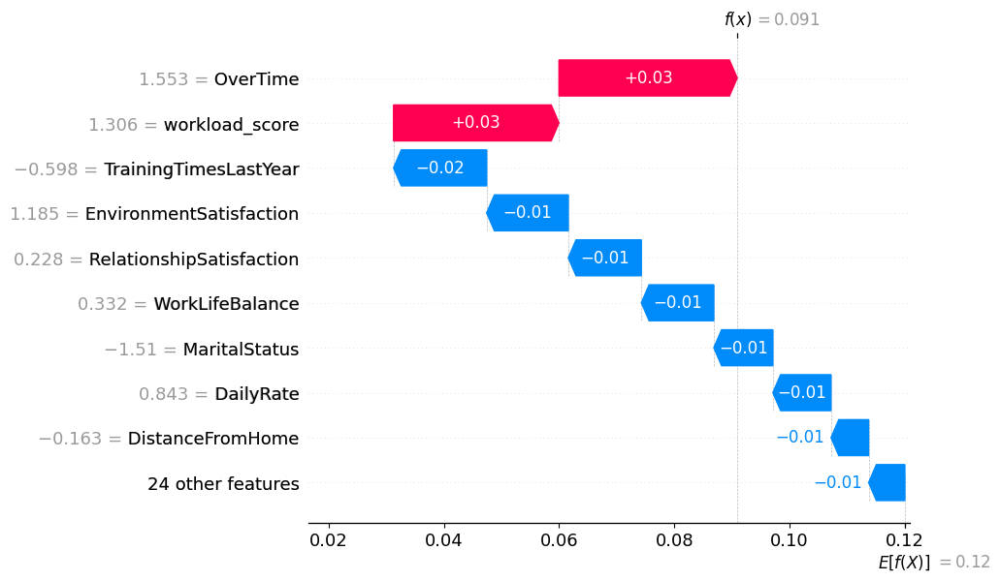

In [ ]:
plots.waterfall(explanation[5])

The expected value is 0.12. features like OverTime, workload_score increase the probability of attrition, However other features decrease it.


In [ ]:
shap.initjs()
plots.force(explainer.expected_value[1],
            shap_values[0, :, 1],
            features=list(X_train.columns))

This is for a single example. The blue arrows (features) pushes the prediction towards attrition.

In [ ]:
shap.initjs()
base_value = explainer.expected_value[1]
sv = shap_values[0:100, :, 0]
X = X_test.iloc[0:100, :]
shap.plots.force(base_value, sv, X)

This plot visualizes contributions of features for multiple instances. Red areas shows positive SHAP values that increase predictions. Blue areas shows negative SHAP values and decrease predictions.

In [ ]:
features = ['Age', 'MonthlyIncome']
X_train_dp = X_train[features]
X_test_dp = X_test[features]
knn = KNeighborsClassifier(n_neighbors=5).fit(X_train_dp, y_train)

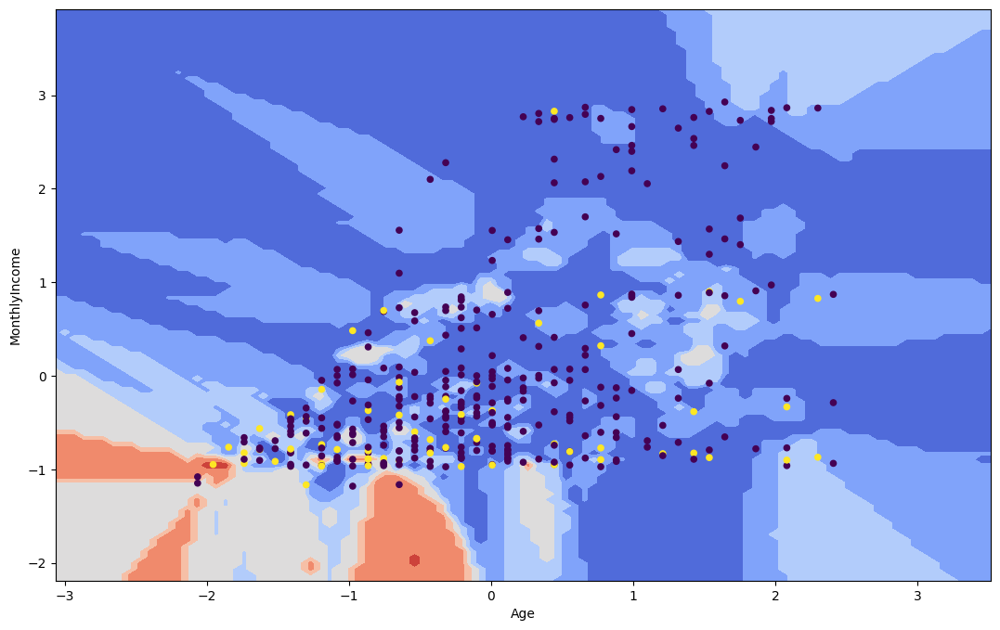

In [ ]:
from sklearn.inspection import DecisionBoundaryDisplay
fig, ax = plt.subplots(1, 1, figsize=(13, 8))
disp = DecisionBoundaryDisplay.from_estimator(knn,
    X_train_dp[features], grid_resolution=100, cmap='coolwarm',
    xlabel=features[0], ylabel=features[1], ax=ax
)

disp.ax_.scatter(
    X_test['Age'], X_test['MonthlyIncome'], c=y_test, s=20
)


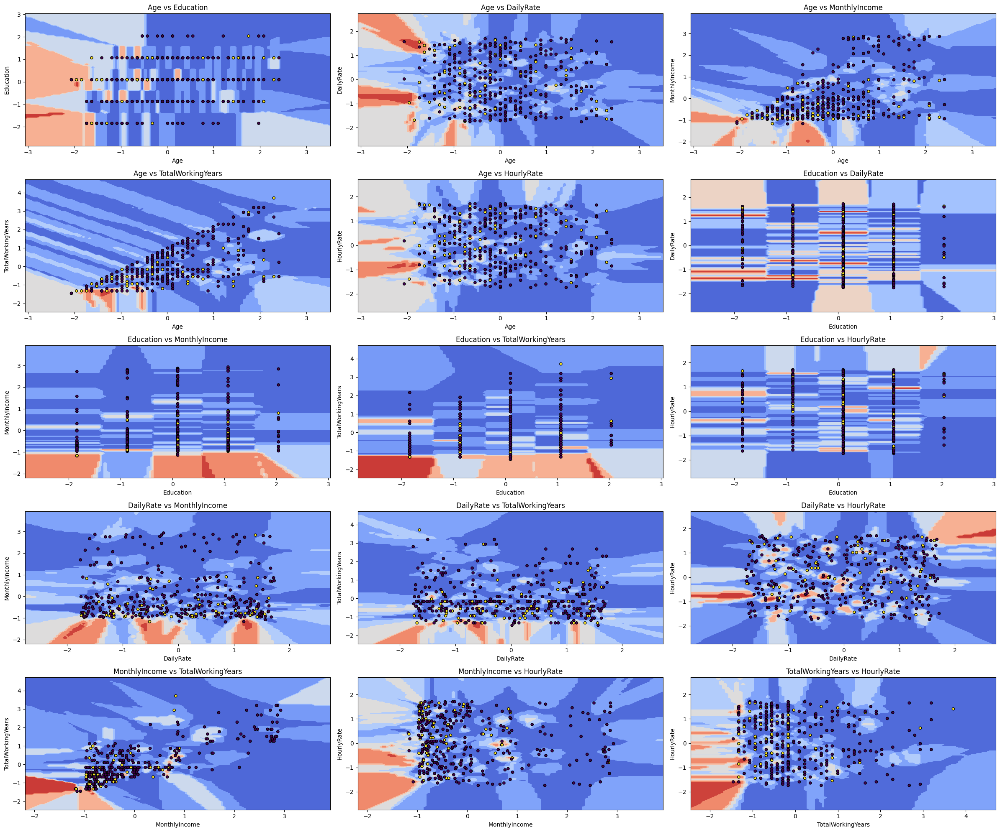

In [ ]:
from itertools import combinations
from sklearn.inspection import DecisionBoundaryDisplay

important_features = ['Age', 'Education', 'DailyRate', 'MonthlyIncome', 'TotalWorkingYears', 'HourlyRate']
feature_pairs = list(combinations(important_features, 2))

n_cols = 3
n_rows = (len(feature_pairs) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(24, 4 * n_rows))

for ax, (f1, f2) in zip(axes.flatten(), feature_pairs):
    X_train_dp = X_train[[f1, f2]]
    X_test_dp  = X_test[[f1, f2]]
    knn = KNeighborsClassifier(n_neighbors=5).fit(X_train_dp, y_train)

    disp = DecisionBoundaryDisplay.from_estimator(
        knn, X_train_dp,
        grid_resolution=100, cmap='coolwarm',
        xlabel=f1, ylabel=f2, ax=ax
    )
    disp.ax_.scatter(
        X_test_dp[f1], X_test_dp[f2],
        c=y_test, s=20, edgecolor='k'
    )
    ax.set_title(f'{f1} vs {f2}')

plt.tight_layout()